In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

import contextily as cx
from mpl_toolkits.axes_grid1 import make_axes_locatable


# Geometry and Database

- Import geometry
- Import TPS dataset
- Merge join to geometry to DPT dataset
- later join to demography and economic database
- find inferences


In [2]:
# import geometry
gdf = gpd.read_file('D:/Files/6. Work/3. Freelance/1. Datakota/2. Politico/politico-master/politico-master/data/DKI_Pilgub.geojson')
gdf_dapil = gpd.read_file('D:/Files/6. Work/3. Freelance/1. Datakota/2. Politico/politico-master/politico-master/data/DKI_Dapil_Without_KepSeribu.geojson')


In [3]:
# import
df_pilgub = pd.read_excel('D:/Files/6. Work/3. Freelance/1. Datakota/2. Politico/politico-master/politico-master/data/DKI_Pilgub_DapilUpdated.xlsx')
columns_to_keep = ['KODE_KEL_DESA', 'namadapil', 'wilayahdapil', 'jmlkursidapil']
df_pilgub = df_pilgub[columns_to_keep]
df_pilgub.columns                     

Index(['KODE_KEL_DESA', 'namadapil', 'wilayahdapil', 'jmlkursidapil'], dtype='object')

In [4]:
gdf = gdf.merge(df_pilgub, on='KODE_KEL_DESA')
gdf.head()

,KODE_KEL_DESA,KODE_KEC,KODE_KAB_KOTA,KODE_PROVINSI,NAMA_KEL_DESA,NAMA_KECAMATAN,NAMA_KAB_KOTA,NAMA_PROVINSI,LUAS_HA,LUAS_SQKM,...,paslon03,rankpaslon01,rankpaslon02,rankpaslon03,strengthbase,strengthscore,geometry,namadapil,wilayahdapil,jmlkursidapil
0,31.72.05.1003,31.72.05,31.72,31,Ancol,Pademangan,Kota Administrasi Jakarta Utara,DKI Jakarta,826.183438,8.261834,...,1391,1,2,3,Very Strong,5,"POLYGON Z ((42105.862 9322466.466 0, 42083.89 ...",DKI Jakarta 3,Jakarta Utara-B,9
1,31.73.04.1007,31.73.04,31.73,31,Angke,Tambora,Kota Administrasi Jakarta Barat,DKI Jakarta,79.870229,0.798702,...,4741,2,1,3,Moderate,3,"POLYGON Z ((35010.979 9318562.522 0, 35010.566...",DKI Jakarta 9,Jakarta Barat-A,12
2,31.75.04.1005,31.75.04,31.75,31,Balekambang,Kramatjati,Kota Administrasi Jakarta Timur,DKI Jakarta,169.635973,1.696360,...,1569,1,2,3,Very Strong,5,"POLYGON Z ((41570.433 9305229.563 0, 41551.447...",DKI Jakarta 5,Jakarta Timur-B,10
3,31.75.03.1003,31.75.03,31.75,31,Bali Mester,Jatinegara,Kota Administrasi Jakarta Timur,DKI Jakarta,67.550190,0.675502,...,1614,2,1,3,Moderate,3,"POLYGON Z ((41889.209 9311621.356 0, 41890.282...",DKI Jakarta 5,Jakarta Timur-B,10
4,31.75.10.1006,31.75.10,31.75,31,Bambu Apus,Cipayung,Kota Administrasi Jakarta Timur,DKI Jakarta,354.500695,3.545007,...,689,2,1,3,Moderate,3,"POLYGON Z ((47778.435 9301610.681 0, 47770.995...",DKI Jakarta 6,Jakarta Timur-C,10


In [5]:
gdf_map = gdf[gdf['NAMA_KAB_KOTA'] != 'Administrasi Kepulauan Seribu']

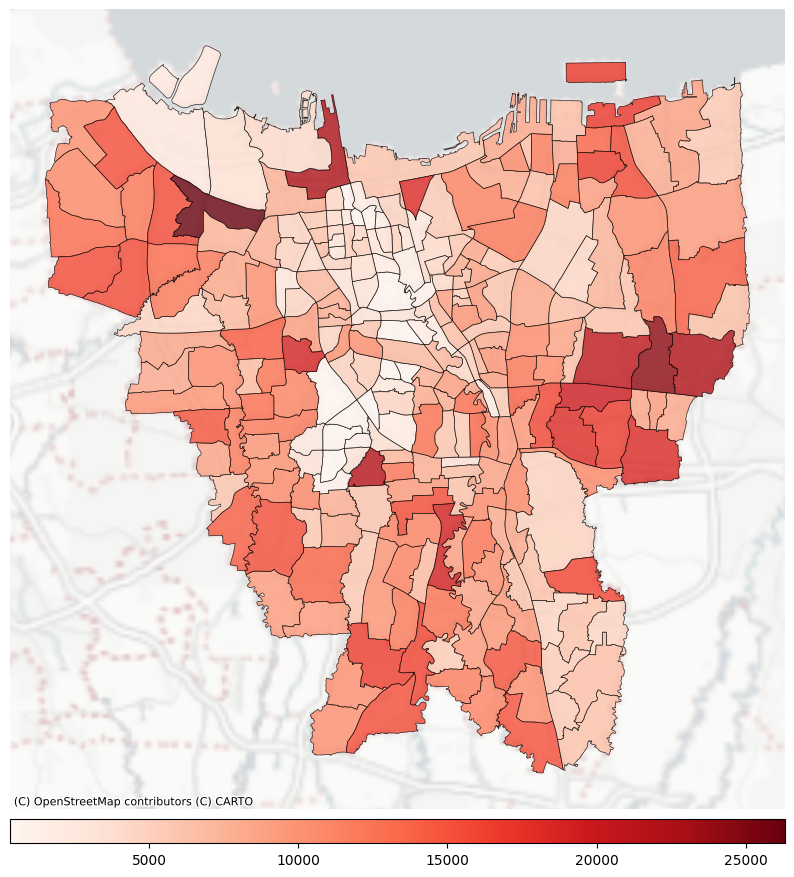

In [6]:
fig, ax = plt.subplots(figsize = (10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map = gdf_map.plot(ax=ax,
                   column='aniessandi',
                   edgecolor = 'k',
                   cmap = 'Reds',
                   linewidth = 0.5,
                   legend= True,
                   alpha = 0.8,
                   cax = cax,
                   categorical = False,
                   legend_kwds={"orientation": "horizontal"}
                   )


map = cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_map.crs, zoom=10, )
map = ax.set_axis_off()

map

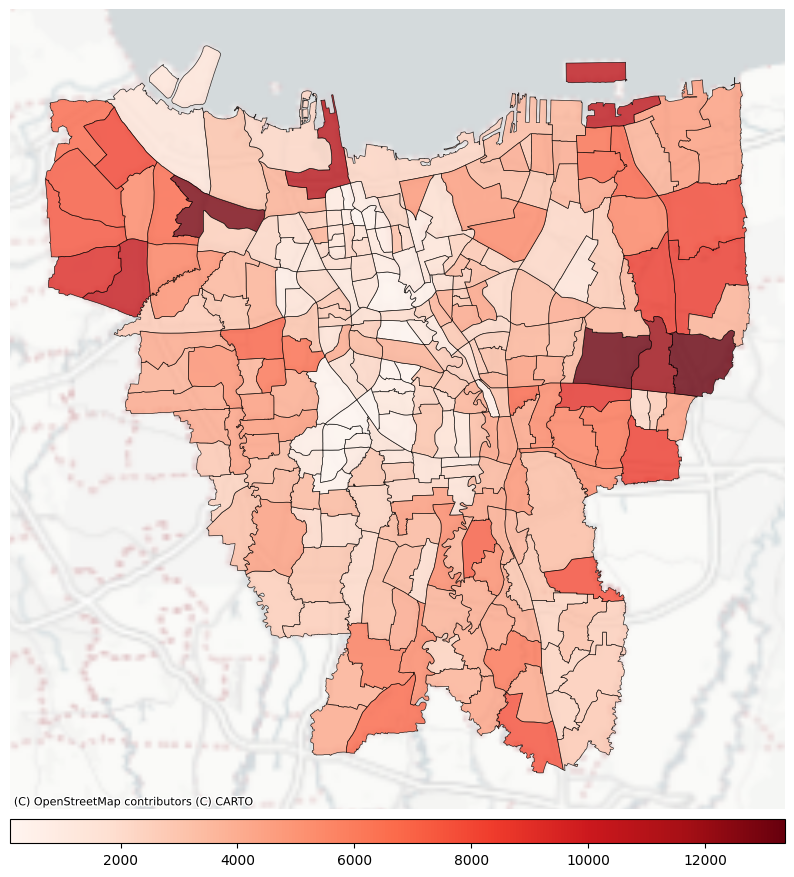

In [7]:
fig, ax = plt.subplots(figsize = (10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map = gdf_map.plot(ax=ax,
                   column='agussylvi',
                   edgecolor = 'k',
                   cmap = 'Reds',
                   linewidth = 0.5,
                   legend= True,
                   alpha = 0.8,
                   cax = cax,
                   categorical = False,
                   legend_kwds={"orientation": "horizontal"}
                   )


map = cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_map.crs, zoom=10, )
map = ax.set_axis_off()

map

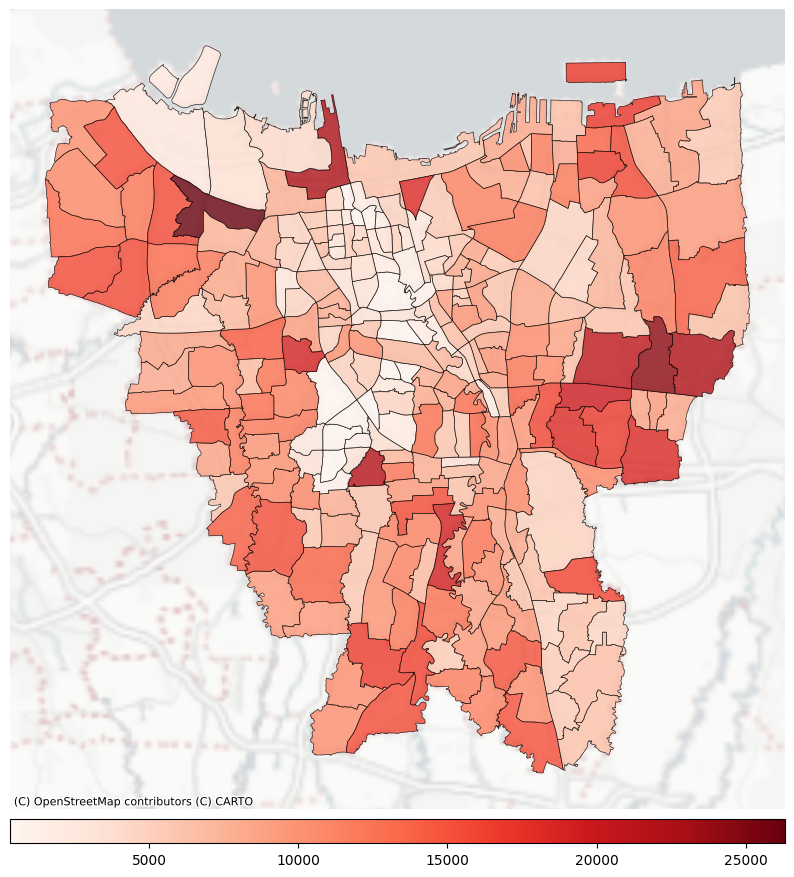

In [8]:
fig, ax = plt.subplots(figsize = (10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map = gdf_map.plot(ax=ax,
               column='aniessandi',
               edgecolor = 'k',
               cmap = 'Reds',
               linewidth = 0.5,
               legend= True,
               alpha = 0.8,
               cax = cax,
               categorical = False,
               legend_kwds={"orientation": "horizontal"}
               )


map = cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_map.crs, zoom=10, )
map = ax.set_axis_off()

map

# Finding most likely winner on each kelurahan

In [9]:
# Select relevant columns for gdf_most and create a copy
df_most = gdf[['NAMA_KEL_DESA', 'NAMA_KECAMATAN', 'NAMA_KAB_KOTA', 'aniessandi', 'ahokdjarot', 'agussylvi']].copy()

# Define the list of percentage columns to rank
numeric_columns = ['agussylvi', 'ahokdjarot', 'aniessandi']

# Define a function to get the sorted column names based on row values
def get_sorted_columns(row):
    numeric_row = row[numeric_columns]
    return numeric_row.sort_values(ascending=False).index.tolist()

# Apply the function to each row and create a new column with sorted percentages
df_most['sorted'] = df_most.apply(get_sorted_columns, axis=1)

# Extract the ranked columns into separate new columns
for i in range(3):
    df_most[f'rank_{i+1}'] = df_most['sorted'].apply(lambda x: x[i] if len(x) > i else np.nan)

# Drop the temporary 'sorted' column
df_most = df_most.drop(columns=['sorted'])

# Renaming values in rank columns
# rename_dict = {
#     'paslon01_%': 'paslon01',
#     'paslon02_%': 'paslon02',
#     'paslon03_%': 'paslon03'
# }
# 
# df_most['rank1'] = df_most['rank_1'].replace(rename_dict)
# df_most['rank2'] = df_most['rank_2'].replace(rename_dict)
# df_most['rank3'] = df_most['rank_3'].replace(rename_dict)
df_most


,NAMA_KEL_DESA,NAMA_KECAMATAN,NAMA_KAB_KOTA,aniessandi,ahokdjarot,agussylvi,rank_1,rank_2,rank_3
0,Ancol,Pademangan,Kota Administrasi Jakarta Utara,6147,4834,2366,aniessandi,ahokdjarot,agussylvi
1,Angke,Tambora,Kota Administrasi Jakarta Barat,5699,10379,2599,ahokdjarot,aniessandi,agussylvi
2,Balekambang,Kramatjati,Kota Administrasi Jakarta Timur,9279,4695,3891,aniessandi,ahokdjarot,agussylvi
3,Bali Mester,Jatinegara,Kota Administrasi Jakarta Timur,1983,3779,757,ahokdjarot,aniessandi,agussylvi
4,Bambu Apus,Cipayung,Kota Administrasi Jakarta Timur,6282,6705,3343,ahokdjarot,aniessandi,agussylvi
...,...,...,...,...,...,...,...,...,...
262,Pulau Pari,Kepulauan Seribu Selatan,Administrasi Kepulauan Seribu,241,494,184,ahokdjarot,aniessandi,agussylvi
263,Pulau Harapan,Kepulauan Seribu Utara,Administrasi Kepulauan Seribu,231,400,166,ahokdjarot,aniessandi,agussylvi
264,Pulau Kelapa,Kepulauan Seribu Utara,Administrasi Kepulauan Seribu,313,581,281,ahokdjarot,aniessandi,agussylvi
265,Pulau Panggang,Kepulauan Seribu Utara,Administrasi Kepulauan Seribu,238,527,233,ahokdjarot,aniessandi,agussylvi


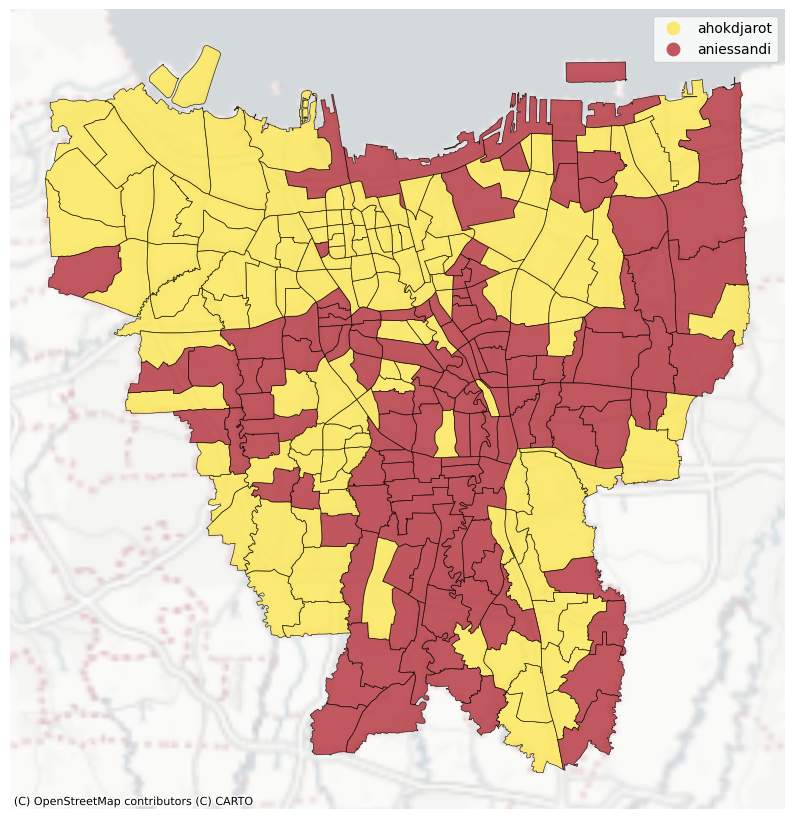

In [10]:
from matplotlib.colors import ListedColormap

df_most2 = df_most.copy().drop(columns = ['agussylvi', 'ahokdjarot', 'aniessandi'])
gdf_a = pd.merge(gdf_map, df_most2, on = 'NAMA_KEL_DESA', how= 'left')

# Define a custom colormap
candidates = df_most2.columns[:4].tolist()
# candidates = gdf_a['rank_1'].unique().tolist() # + gdf_a['rank_2'].unique().tolist() + gdf_a['rank_3'].unique().tolist()
# candidates = list(set(candidates))  # Ensure unique candidates
candidates.sort(reverse=False)

# Define colors (you can specify your own colors here)
colors = [(252, 230, 82), (66, 90, 170), (179, 48, 58)]  # Replace with exact RGB values from your image

# Convert RGB to normalized values for matplotlib
colors = [(r/255, g/255, b/255) for r, g, b in colors]
cmap = ListedColormap(colors)

# Create a dictionary for candidate to color mapping
# candidate_color_map = {candidate: colors[i] for i, candidate in enumerate(candidates)}

# Function to plot the map for a given rank
def plot_rank_map(rank_column, ax):
    gdf_a.plot(ax=ax,
               column=rank_column,
               edgecolor='k',
               linewidth=0.5,
               legend=True,
               alpha=0.8,
               cmap=cmap,
               categorical=True)
    cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs.to_string(), zoom=10)
    ax.set_axis_off()

fig, ax = plt.subplots(figsize = (10,15))
plot_rank_map('rank_1', ax)

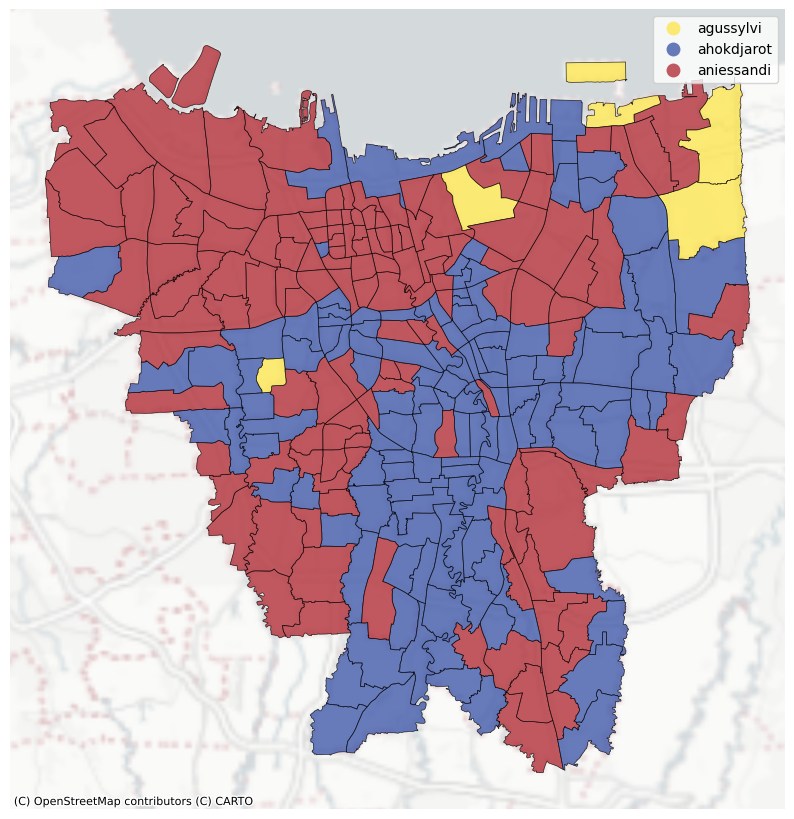

In [11]:
fig, ax = plt.subplots(figsize = (10,15))
plot_rank_map('rank_2', ax)

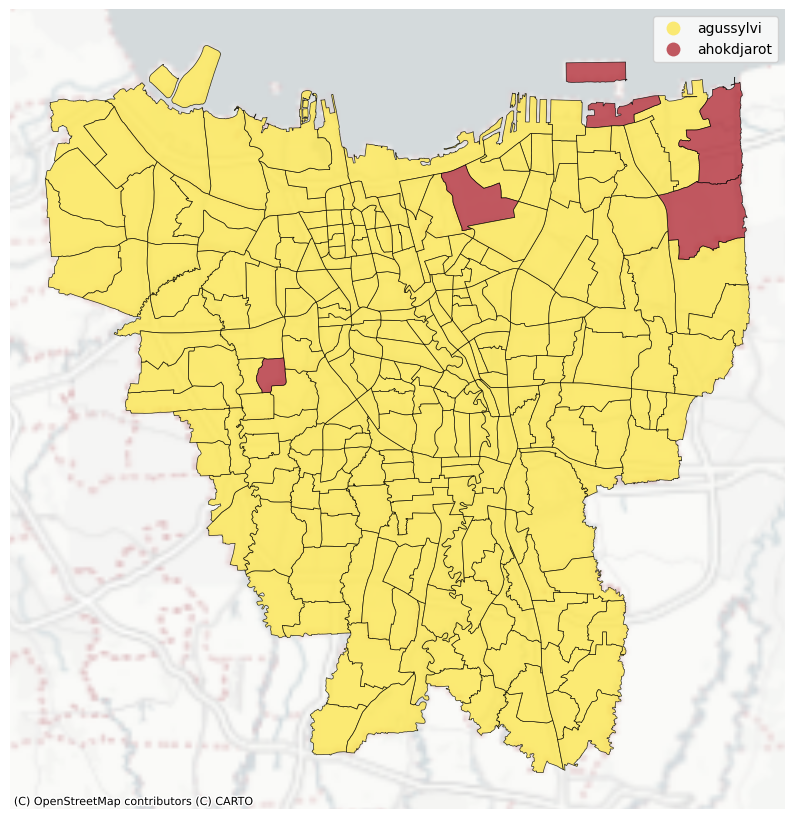

In [12]:
fig, ax = plt.subplots(figsize = (10,15))
plot_rank_map('rank_3', ax)

# Kelurahan recapitulation

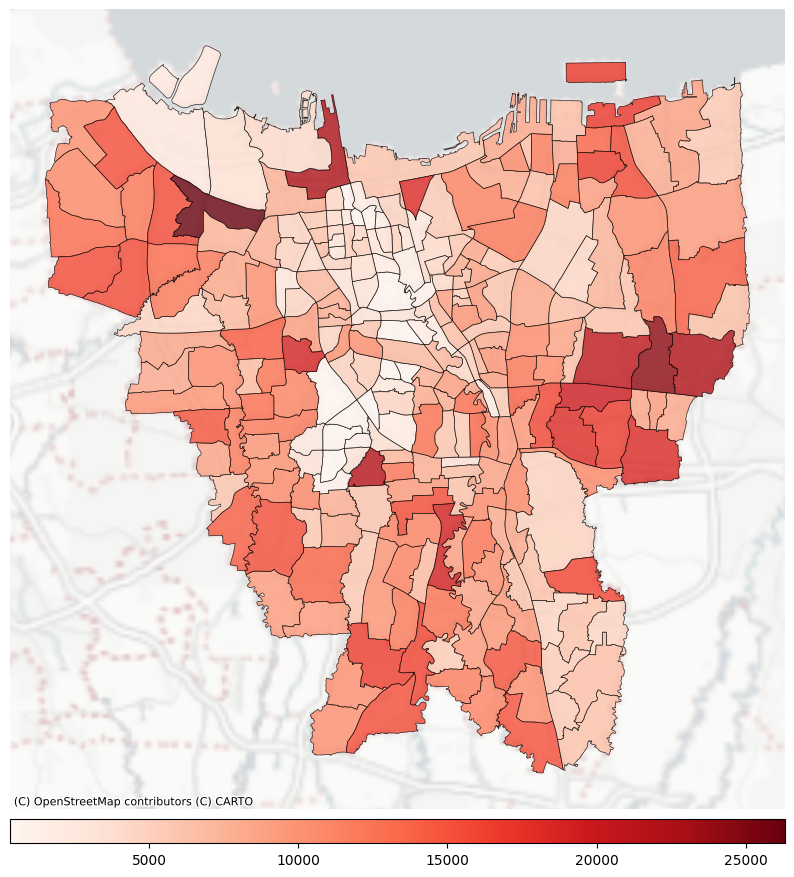

In [13]:
#gdf_a = pd.merge(gdf_dpt, df_a, on = 'NAMA_KAB_KOTA', how= 'left')
    

fig, ax = plt.subplots(figsize = (10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map = gdf_a.plot(ax=ax,
    column='aniessandi',
    edgecolor = 'k',
    cmap = 'Reds',
    linewidth = 0.5,
    legend= True,  
    alpha = 0.8,
    cax = cax,
    categorical = False,
    legend_kwds={"orientation": "horizontal"}
    )


map = cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs, zoom=10, )
map = ax.set_axis_off()

map

In [14]:
Q1 = gdf_a['aniessandi'].quantile(0.25)
Q2 = gdf_a['aniessandi'].median()
Q3 = gdf_a['aniessandi'].quantile(0.75)

Q1, Q2, Q3

(np.float64(4828.0), np.float64(8063.0), np.float64(10914.0))

In [15]:
gdf_a['Kategori_Kelurahan'] = ''
for i in range(0,len(gdf_a)):
    if gdf_a['aniessandi'][i] <= Q1:
        gdf_a['Kategori_Kelurahan'][i] = 'C_Weak'
    elif gdf_a['aniessandi'][i] <= Q3:
        gdf_a['Kategori_Kelurahan'][i] = 'B_Moderate'
    else:
        gdf_a['Kategori_Kelurahan'][i] = 'A_Strong'


gdf_a.head()

C:\Users\irsra\AppData\Local\Temp\ipykernel_10944\3777140494.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  gdf_a['Kategori_Kelurahan'][i] = 'B_Moderate'
C:\Users\irsra\AppData\Local\Temp\ipykernel_10944\3777140494.py:6: SettingWithCopy

,KODE_KEL_DESA,KODE_KEC,KODE_KAB_KOTA,KODE_PROVINSI,NAMA_KEL_DESA,NAMA_KECAMATAN_x,NAMA_KAB_KOTA_x,NAMA_PROVINSI,LUAS_HA,LUAS_SQKM,...,geometry,namadapil,wilayahdapil,jmlkursidapil,NAMA_KECAMATAN_y,NAMA_KAB_KOTA_y,rank_1,rank_2,rank_3,Kategori_Kelurahan
0,31.72.05.1003,31.72.05,31.72,31,Ancol,Pademangan,Kota Administrasi Jakarta Utara,DKI Jakarta,826.183438,8.261834,...,"POLYGON Z ((42105.862 9322466.466 0, 42083.89 ...",DKI Jakarta 3,Jakarta Utara-B,9,Pademangan,Kota Administrasi Jakarta Utara,aniessandi,ahokdjarot,agussylvi,B_Moderate
1,31.73.04.1007,31.73.04,31.73,31,Angke,Tambora,Kota Administrasi Jakarta Barat,DKI Jakarta,79.870229,0.798702,...,"POLYGON Z ((35010.979 9318562.522 0, 35010.566...",DKI Jakarta 9,Jakarta Barat-A,12,Tambora,Kota Administrasi Jakarta Barat,ahokdjarot,aniessandi,agussylvi,B_Moderate
2,31.75.04.1005,31.75.04,31.75,31,Balekambang,Kramatjati,Kota Administrasi Jakarta Timur,DKI Jakarta,169.635973,1.696360,...,"POLYGON Z ((41570.433 9305229.563 0, 41551.447...",DKI Jakarta 5,Jakarta Timur-B,10,Kramatjati,Kota Administrasi Jakarta Timur,aniessandi,ahokdjarot,agussylvi,B_Moderate
3,31.75.03.1003,31.75.03,31.75,31,Bali Mester,Jatinegara,Kota Administrasi Jakarta Timur,DKI Jakarta,67.550190,0.675502,...,"POLYGON Z ((41889.209 9311621.356 0, 41890.282...",DKI Jakarta 5,Jakarta Timur-B,10,Jatinegara,Kota Administrasi Jakarta Timur,ahokdjarot,aniessandi,agussylvi,C_Weak
4,31.75.10.1006,31.75.10,31.75,31,Bambu Apus,Cipayung,Kota Administrasi Jakarta Timur,DKI Jakarta,354.500695,3.545007,...,"POLYGON Z ((47778.435 9301610.681 0, 47770.995...",DKI Jakarta 6,Jakarta Timur-C,10,Cipayung,Kota Administrasi Jakarta Timur,ahokdjarot,aniessandi,agussylvi,B_Moderate


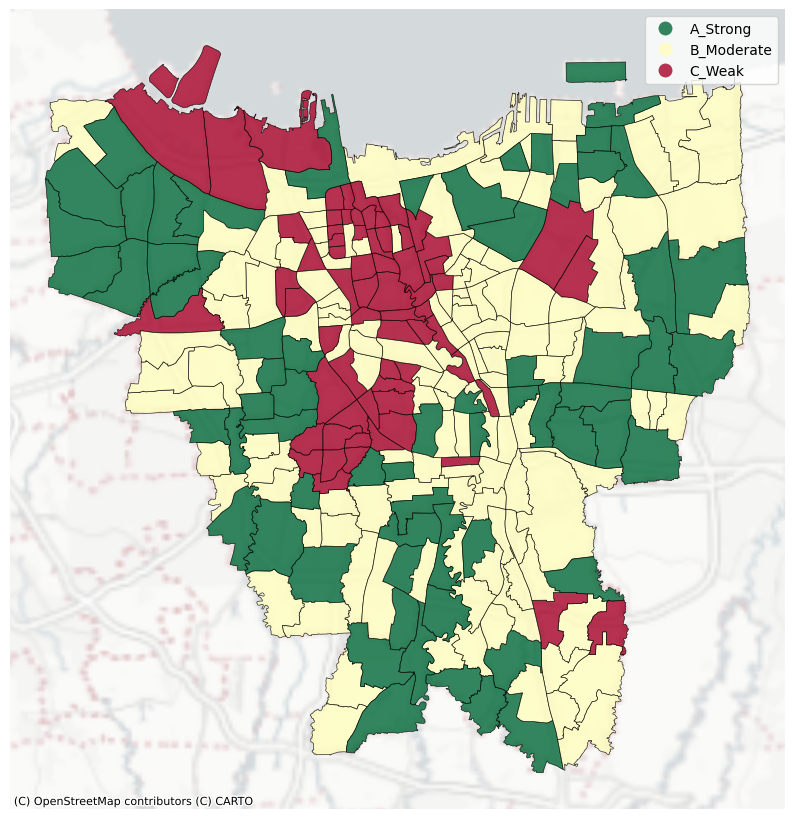

In [16]:
#gdf_a = pd.merge(gdf_dpt, df_a, on = 'NAMA_KAB_KOTA', how= 'left')


fig, ax = plt.subplots(figsize = (10,15))

# divider = make_axes_locatable(ax)
# cax = divider.append_axes("bottom", size="3%", pad=0.1)

map = gdf_a.plot(ax=ax,
                 column='Kategori_Kelurahan',
                 edgecolor = 'k',
                 cmap = 'RdYlGn_r',
                 linewidth = 0.5,
                 legend= True,
                 alpha = 0.8,
                 #cax = cax,
                 categorical = True,
                 #legend_kwds={"orientation": "horizontal"}
                 )


map = cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs, zoom=10, )
map = ax.set_axis_off()

map

In [17]:
gdf_a['strengthbase'].unique

<bound method Series.unique of 0      Very Strong
1         Moderate
2      Very Strong
3         Moderate
4         Moderate
          ...     
256    Very Strong
257    Very Strong
258    Very Strong
259       Moderate
260           Weak
Name: strengthbase, Length: 261, dtype: object>

In [18]:
gdf_kota = gdf_a.dissolve(by='NAMA_KAB_KOTA_x')
aggfuncs = {col: 'sum' for col in numeric_columns}
aggfuncs.update({col: 'first' for col in gdf_a.columns if col not in numeric_columns and col != 'geometry'})
gdf_kec = gdf_a.dissolve(by='NAMA_KECAMATAN_x', aggfunc=aggfuncs)

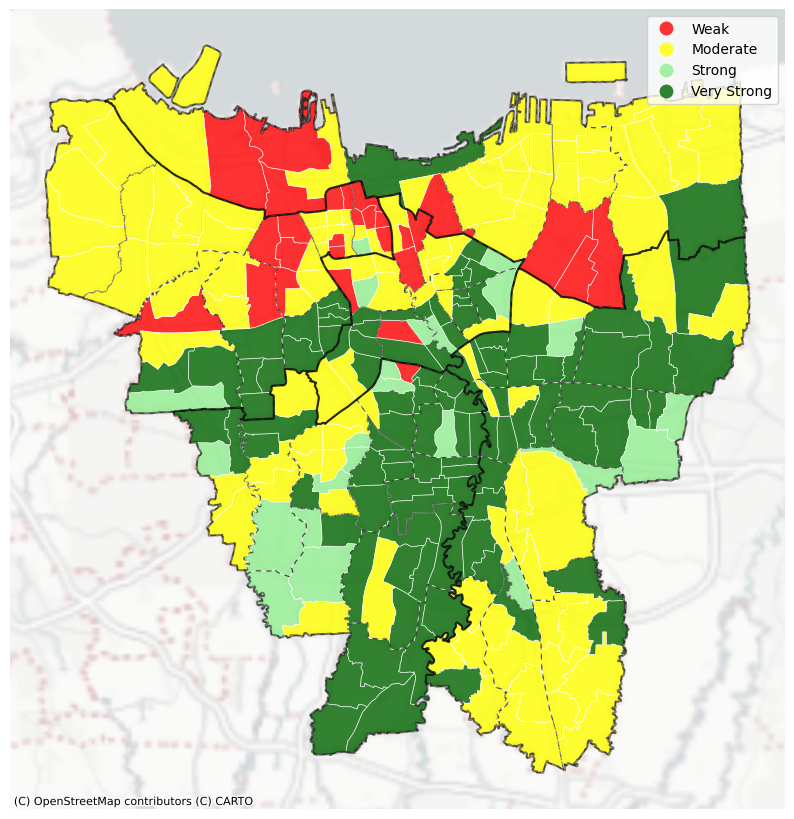

In [19]:
# Define the custom colormap
colors = ['red', 'yellow', 'lightgreen', 'darkgreen']
cmap = ListedColormap(colors)

# Define the strength categories
strength_categories = ['Weak', 'Moderate', 'Strong', 'Very Strong']

# Convert 'strengthbase' to a categorical type with the specified order
gdf_a['strengthbase'] = pd.Categorical(gdf_a['strengthbase'], categories=strength_categories, ordered=True)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 15))

map_plot = gdf_a.plot(ax=ax,
                      column='strengthbase',
                      edgecolor='white',
                      cmap=cmap,
                      linewidth=0.5,
                      legend=True,
                      alpha=0.8,
                      categorical=True)

gdf_kec.plot(ax=ax,
                   edgecolor='k',
                   linewidth=0.75,
                   linestyle=(0, (5, 5)),  # Custom dash pattern
                   alpha=0.5,
                   facecolor='none')  # facecolor='none' ensures that only boundaries are plotted

# Plotting kota boundaries
gdf_kota.plot(ax=ax,
              edgecolor='k',
              linewidth=1.5,
              alpha=0.5,
              facecolor='none')

# Add the basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs, zoom=10)

# Remove axis
ax.set_axis_off()

# Show the plot
plt.show()


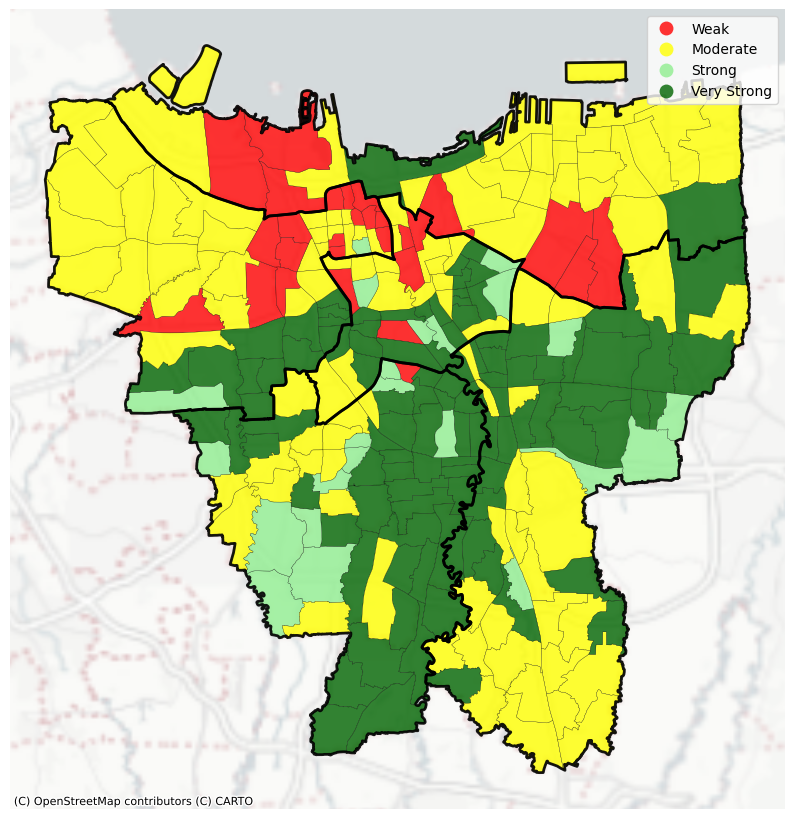

In [20]:
# Define the custom colormap
colors = ['red', 'yellow', 'lightgreen', 'darkgreen']
cmap = ListedColormap(colors)

# Define the strength categories
strength_categories = ['Weak', 'Moderate', 'Strong', 'Very Strong']

# Convert 'strengthbase' to a categorical type with the specified order
gdf_a['strengthbase'] = pd.Categorical(gdf_a['strengthbase'], categories=strength_categories, ordered=True)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 15))

# Plot the base layer with strength categories
map_plot = gdf_a.plot(ax=ax,
                      column='strengthbase',
                      edgecolor='black',
                      cmap=cmap,
                      linewidth=0.2,
                      legend=True,
                      alpha=0.8,
                      categorical=True)

# Plot kecamatan boundaries with a dashed line
# gdf_kec.plot(ax=ax,
#              edgecolor='blue',
#              linewidth=0.8,
#              linestyle='--',  # Dashed line
#              alpha=0.9,
#              facecolor='none')  # facecolor='none' ensures that only boundaries are plotted

# Plot kota boundaries with a solid line
gdf_kota.plot(ax=ax,
              edgecolor='black',
              linewidth=2,
              linestyle='-',  # Solid line
              alpha=0.9,
              facecolor='none')

# Add the basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs.to_string(), zoom=10)

# Remove axis
ax.set_axis_off()

# Show the plot
plt.show()


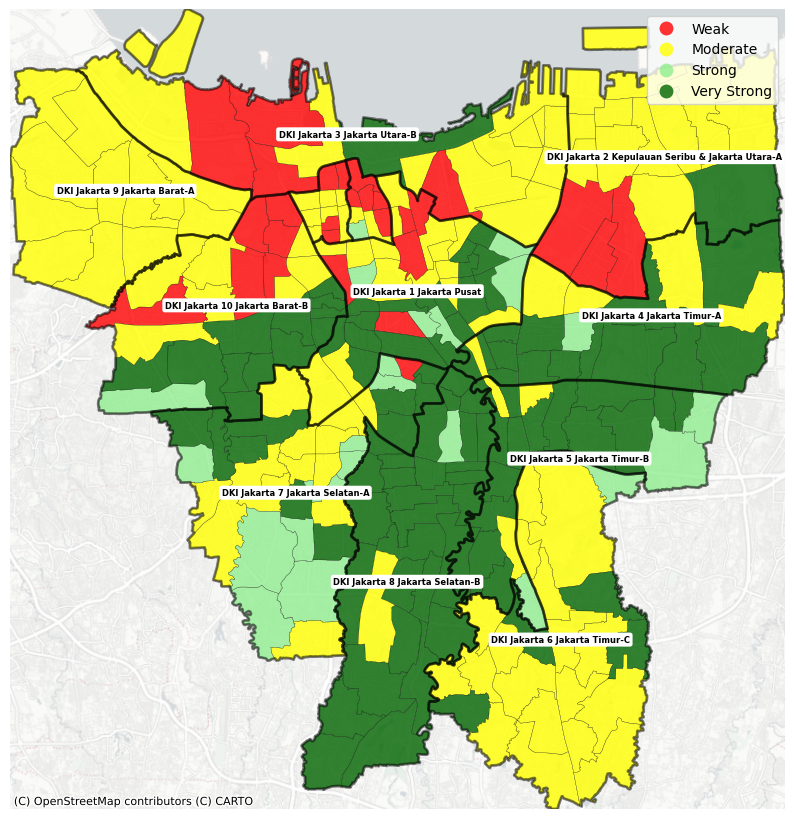

In [21]:
# Define the custom colormap
colors = ['red', 'yellow', 'lightgreen', 'darkgreen']
cmap = ListedColormap(colors)

# Define the strength categories
strength_categories = ['Weak', 'Moderate', 'Strong', 'Very Strong']

# Convert 'strengthbase' to a categorical type with the specified order
gdf_a['strengthbase'] = pd.Categorical(gdf_a['strengthbase'], categories=strength_categories, ordered=True)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 15))

# Plot the base layer with strength categories
gdf_a.plot(ax=ax,
           column='strengthbase',
           edgecolor='black',
           cmap=cmap,
           linewidth=0.2,
           legend=True,
           alpha=0.8,
           categorical=True)

# Overlay the gdf_dapil layer with transparency
gdf_dapil.plot(ax=ax,
               edgecolor='black',
               facecolor='none',
               linewidth=2,
               alpha=0.5)  # Adjust the transparency as needed

# Add labels from gdf_dapil with the 'namadapil' and 'wilayahdapil' columns
for idx, row in gdf_dapil.iterrows():
    centroid = row.geometry.centroid
    plt.annotate(
        text=f"{row['namadapil']} {row['wilayahdapil']}",
        xy=(centroid.x, centroid.y),
        xytext=(3, 3),
        textcoords='offset points',
        fontsize=6,
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment
        color='black',
        weight='bold',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3')
    )

# Set the axis limits to the bounding box of gdf_a
ax.set_xlim(gdf_a.total_bounds[0], gdf_a.total_bounds[2])
ax.set_ylim(gdf_a.total_bounds[1], gdf_a.total_bounds[3])

# Add the basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs.to_string())

# Remove axis
ax.set_axis_off()

# Show the plot
plt.show()


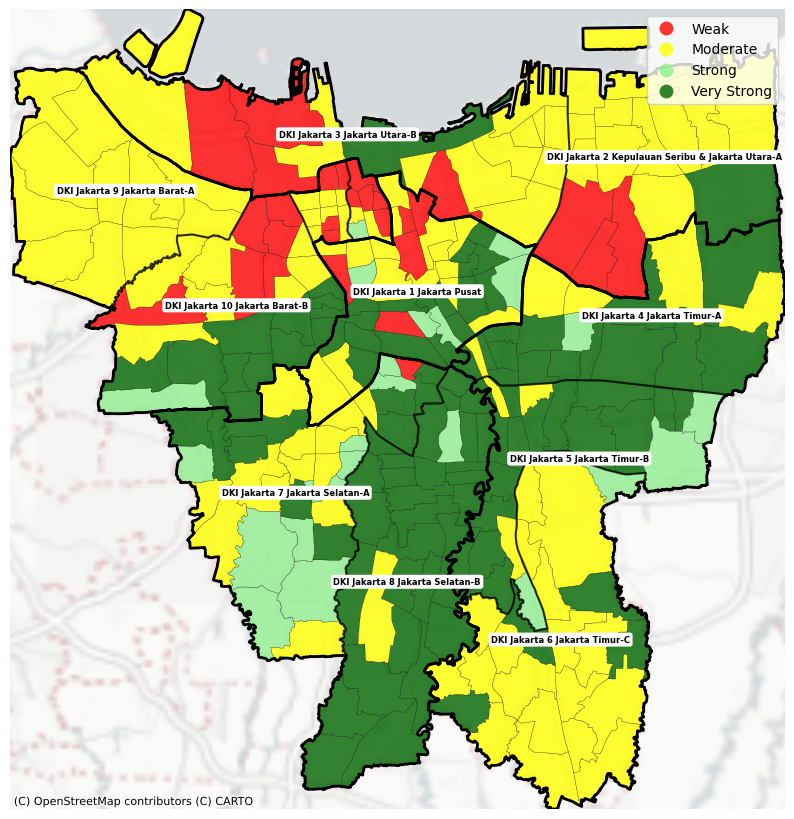

In [22]:
# Define the custom colormap
colors = ['red', 'yellow', 'lightgreen', 'darkgreen']
cmap = ListedColormap(colors)

# Define the strength categories
strength_categories = ['Weak', 'Moderate', 'Strong', 'Very Strong']

# Convert 'strengthbase' to a categorical type with the specified order
gdf_a['strengthbase'] = pd.Categorical(gdf_a['strengthbase'], categories=strength_categories, ordered=True)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 15))

# Plot the base layer with strength categories
map_plot = gdf_a.plot(ax=ax,
                      column='strengthbase',
                      edgecolor='black',
                      cmap=cmap,
                      linewidth=0.2,
                      legend=True,
                      alpha=0.8,
                      categorical=True)

# Plot kota boundaries with a solid line before adding the basemap
gdf_kota.plot(ax=ax,
              edgecolor='black',
              linewidth=2,
              linestyle='-',  # Solid line
              alpha=1,
              facecolor='none')

# Add the basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs.to_string(), zoom=10)

# Overlay the gdf_dapil layer with transparency after adding the basemap
gdf_dapil.plot(ax=ax,
               edgecolor='black',
               facecolor='none',
               linewidth=1.5,
               alpha=0.5)  # Adjust the transparency as needed

# Add labels from gdf_dapil with the 'namadapil' and 'wilayahdapil' columns
for idx, row in gdf_dapil.iterrows():
    centroid = row.geometry.centroid
    plt.annotate(
        text=f"{row['namadapil']} {row['wilayahdapil']}",
        xy=(centroid.x, centroid.y),
        xytext=(3, 3),
        textcoords='offset points',
        fontsize=6,
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment
        color='black',
        weight='bold',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3')
    )

# Set the axis limits to the bounding box of gdf_a
ax.set_xlim(gdf_a.total_bounds[0], gdf_a.total_bounds[2])
ax.set_ylim(gdf_a.total_bounds[1], gdf_a.total_bounds[3])

# Remove axis
ax.set_axis_off()

# Show the plot
plt.show()


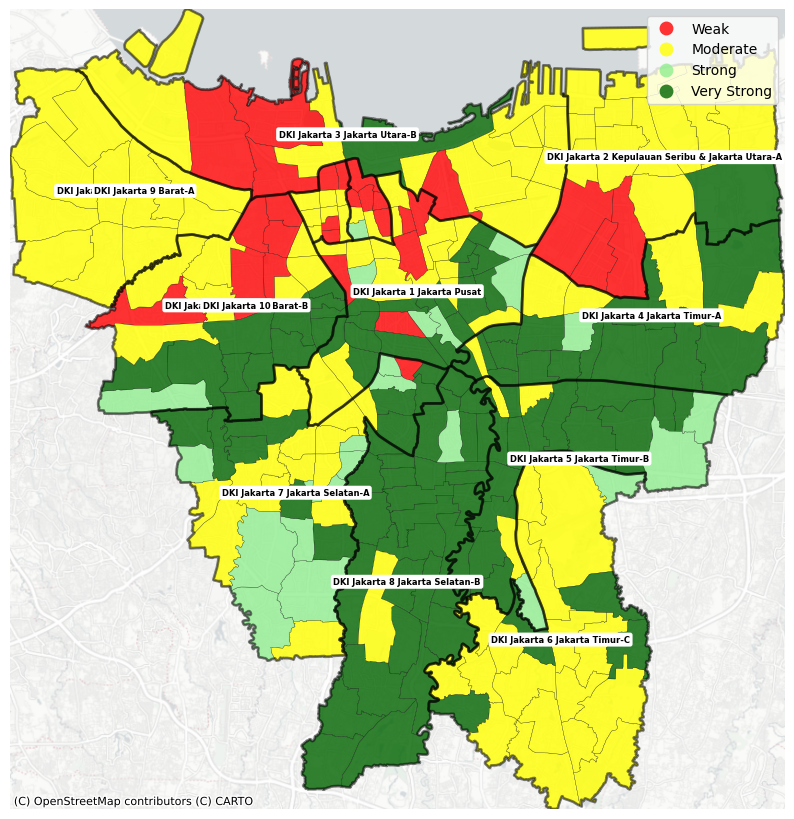

In [23]:
# Define the custom colormap
colors = ['red', 'yellow', 'lightgreen', 'darkgreen']
cmap = ListedColormap(colors)

# Define the strength categories
strength_categories = ['Weak', 'Moderate', 'Strong', 'Very Strong']

# Convert 'strengthbase' to a categorical type with the specified order
gdf_a['strengthbase'] = pd.Categorical(gdf_a['strengthbase'], categories=strength_categories, ordered=True)

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 15))

# Plot the base layer with strength categories
gdf_a.plot(ax=ax,
           column='strengthbase',
           edgecolor='black',
           cmap=cmap,
           linewidth=0.2,
           legend=True,
           alpha=0.8,
           categorical=True)

# Overlay the gdf_dapil layer with transparency
gdf_dapil.plot(ax=ax,
               edgecolor='black',
               facecolor='none',
               linewidth=2,
               alpha=0.5)  # Adjust the transparency as needed

# Add labels from gdf_dapil with the 'namadapil' and 'wilayahdapil' columns
for idx, row in gdf_dapil.iterrows():
    centroid = row.geometry.centroid
    plt.annotate(
        text=f"{row['namadapil']} {row['wilayahdapil']}",
        xy=(centroid.x, centroid.y),
        xytext=(3, 3),
        textcoords='offset points',
        fontsize=6,
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment
        color='black',
        weight='bold',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3')
    )

# Add specific labels for DKI Jakarta 9 and DKI Jakarta 10
dk9_centroid = gdf_dapil[gdf_dapil['namadapil'] == 'DKI Jakarta 9'].geometry.centroid
dk10_centroid = gdf_dapil[gdf_dapil['namadapil'] == 'DKI Jakarta 10'].geometry.centroid

plt.annotate(
    text="DKI Jakarta 9",
    xy=(dk9_centroid.x.values[0], dk9_centroid.y.values[0]),
    xytext=(3, 3),
    textcoords='offset points',
    fontsize=6,
    ha='center',
    va='center',
    color='black',
    weight='bold',
    bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3')
)

plt.annotate(
    text="DKI Jakarta 10",
    xy=(dk10_centroid.x.values[0], dk10_centroid.y.values[0]),
    xytext=(3, 3),
    textcoords='offset points',
    fontsize=6,
    ha='center',
    va='center',
    color='black',
    weight='bold',
    bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3')
)

# Set the axis limits to the bounding box of gdf_a
ax.set_xlim(gdf_a.total_bounds[0], gdf_a.total_bounds[2])
ax.set_ylim(gdf_a.total_bounds[1], gdf_a.total_bounds[3])

# Add the basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_a.crs.to_string())

# Remove axis
ax.set_axis_off()

# Show the plot
plt.show()


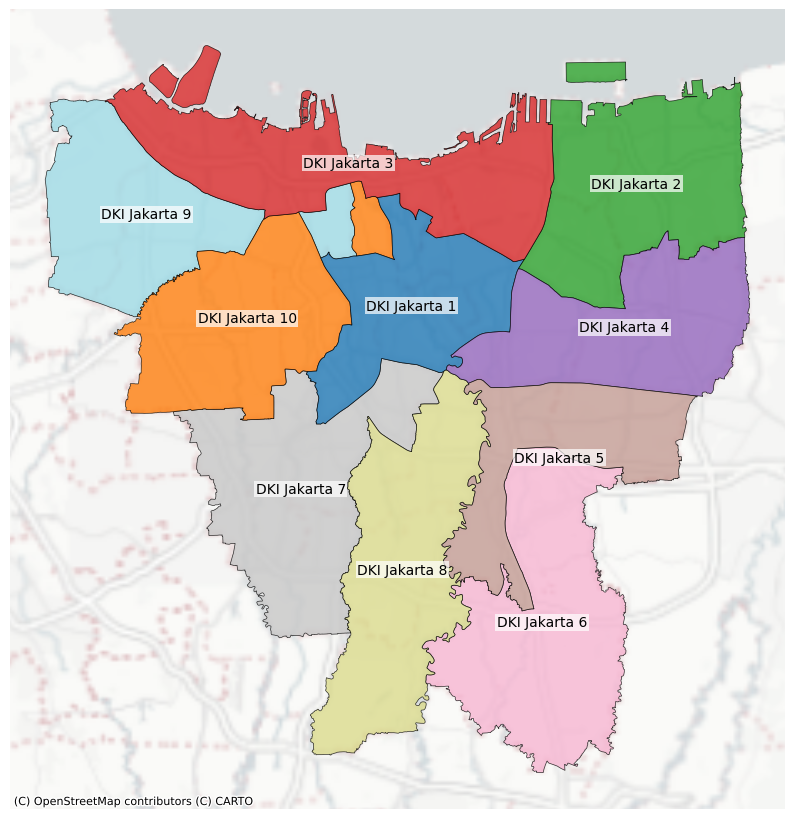

In [24]:
fig, ax = plt.subplots(figsize=(10, 15))

# Plot gdf_dapil with unique values from 'namadapil'
gdf_dapil.plot(ax=ax,
               column='namadapil',
               edgecolor='k',
               cmap='tab20',  # Using a colormap suitable for categorical data
               linewidth=0.5,
               legend=False,
               alpha=0.8,
               categorical=True)

# Add basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_dapil.crs.to_string(), zoom=10)

# Set axis off
ax.set_axis_off()

# Set title with specific font properties
# title_font = {'fontsize': 20, 'fontweight': 'bold', 'fontname': 'Helvetica'}
#ax.set_title(f"PETA DAPIL", pad=20, loc='left', fontsize=title_font['fontsize'], fontdict=title_font)

# Add labels to each geometry from the gdf_dapil DataFrame with halo effect
for idx, row in gdf_dapil.iterrows():
    centroid = row.geometry.centroid
    label = f"{row['namadapil']}"
    ax.text(
        centroid.x, centroid.y, str(label),
        horizontalalignment='center',
        verticalalignment='center',
        fontsize=10,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=1)  # Halo effect
    )

plt.show()


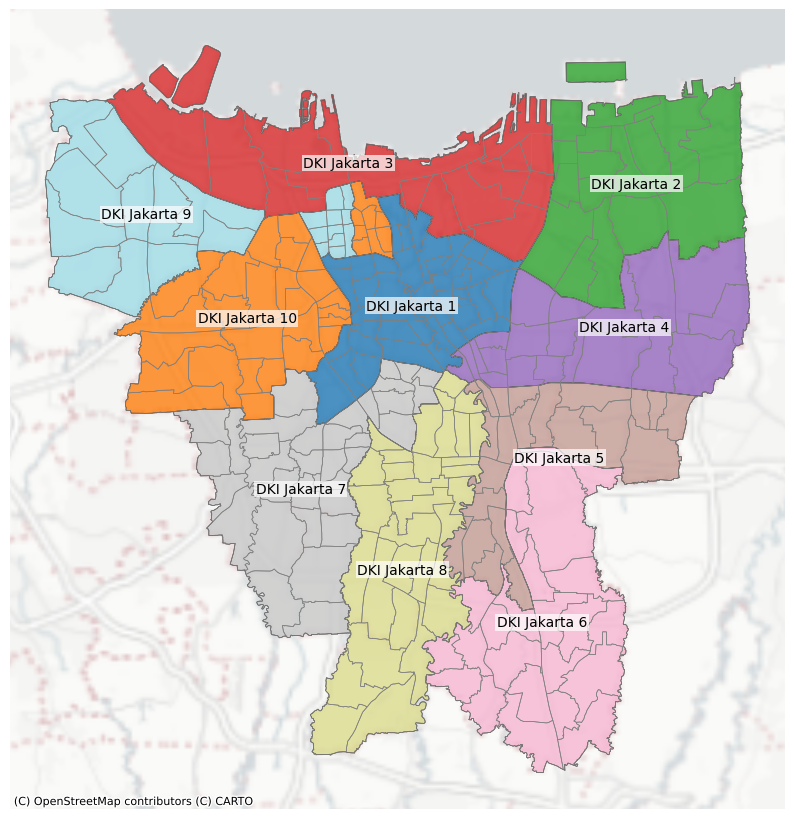

In [25]:

fig, ax = plt.subplots(figsize=(10, 15))

# Plot gdf_a with no fill color and bold edge color
gdf_a.boundary.plot(ax=ax, edgecolor='gray', linewidth=0.5)

# Plot gdf_dapil with unique values from 'namadapil' using a qualitative color ramp
gdf_dapil.plot(ax=ax,
               column='namadapil',
               edgecolor='k',
               cmap='tab20',  # Using the Set1 color ramp for clear distinction
               linewidth=0.5,
               legend=False,
               alpha=0.8,
               categorical=True)

# Add basemap
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_dapil.crs.to_string(), zoom=10)

# Set axis off
ax.set_axis_off()

# # Set title with specific font properties
# title_font = {'fontsize': 20, 'fontweight': 'bold', 'fontname': 'Helvetica'}
# ax.set_title(f"PETA DAPIL", pad=20, loc='left', fontsize=title_font['fontsize'], fontdict=title_font)

# Add labels to each geometry from the gdf_dapil DataFrame with halo effect
for idx, row in gdf_dapil.iterrows():
    centroid = row.geometry.centroid
    label = f"{row['namadapil']}"
    ax.text(
        centroid.x, centroid.y, str(label),
        horizontalalignment='center',
        verticalalignment='center',
        fontsize=10,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=1)  # Halo effect
    )

plt.show()


# Analysis level Kecamatan

In [26]:
gdf_a = pd.merge(gdf_map, df_most2, on = 'NAMA_KEL_DESA', how= 'left')
gdf_kec = gdf_a.dissolve(by='NAMA_KECAMATAN_x', aggfunc='sum')


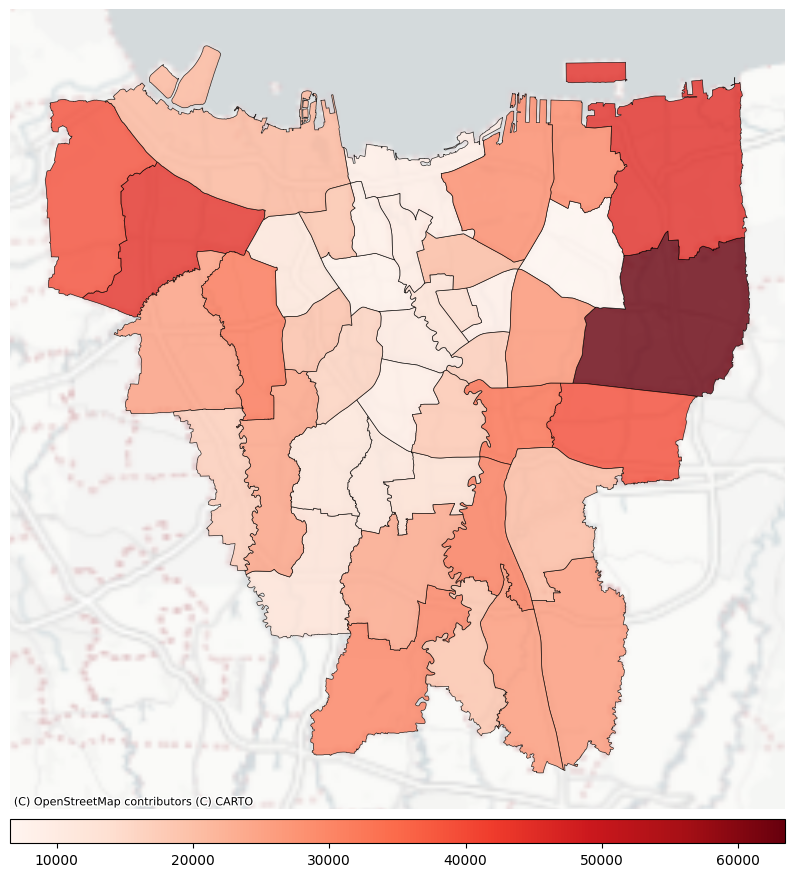

In [27]:
fig, ax = plt.subplots(figsize=(10, 15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map_paslon01_kec = gdf_kec.plot(ax=ax,
                           column='agussylvi',
                           edgecolor='k',
                           cmap='Reds',
                           linewidth=0.5,
                           legend=True,
                           alpha=0.8,
                           cax=cax,
                           categorical=False,
                           legend_kwds={"orientation": "horizontal"}
                           )

cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_kec.crs, zoom=10)
ax.set_axis_off()
plt.show()


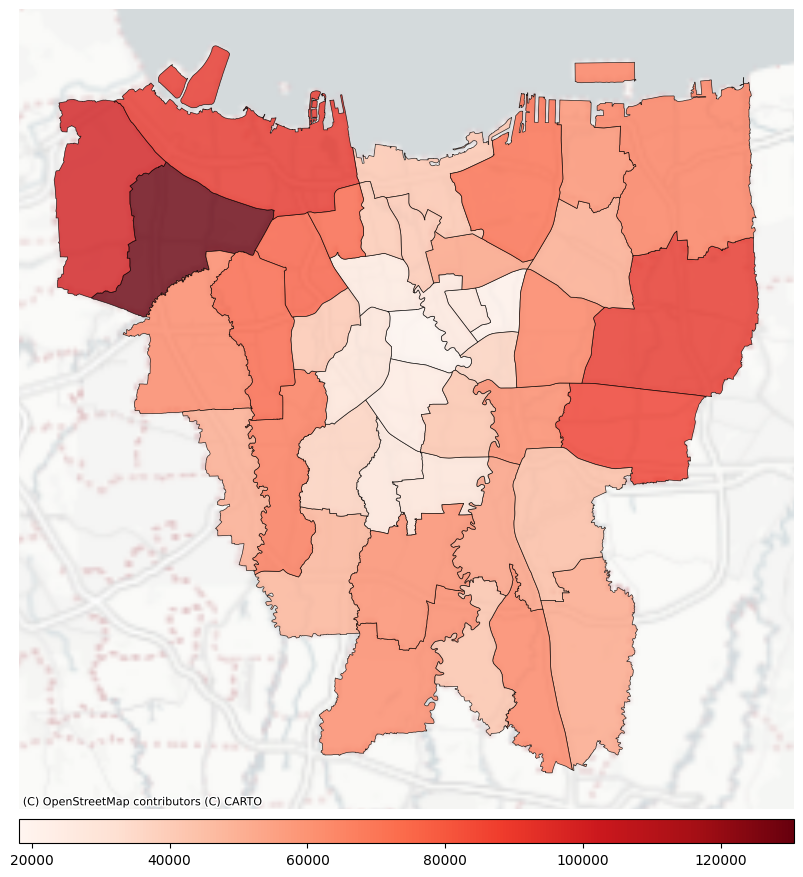

In [28]:
fig, ax = plt.subplots(figsize=(10, 15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map_paslon02_kec = gdf_kec.plot(ax=ax,
                                column='ahokdjarot',
                                edgecolor='k',
                                cmap='Reds',
                                linewidth=0.5,
                                legend=True,
                                alpha=0.8,
                                cax=cax,
                                categorical=False,
                                legend_kwds={"orientation": "horizontal"}
                                )

cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_kec.crs, zoom=10)
ax.set_axis_off()
plt.show()


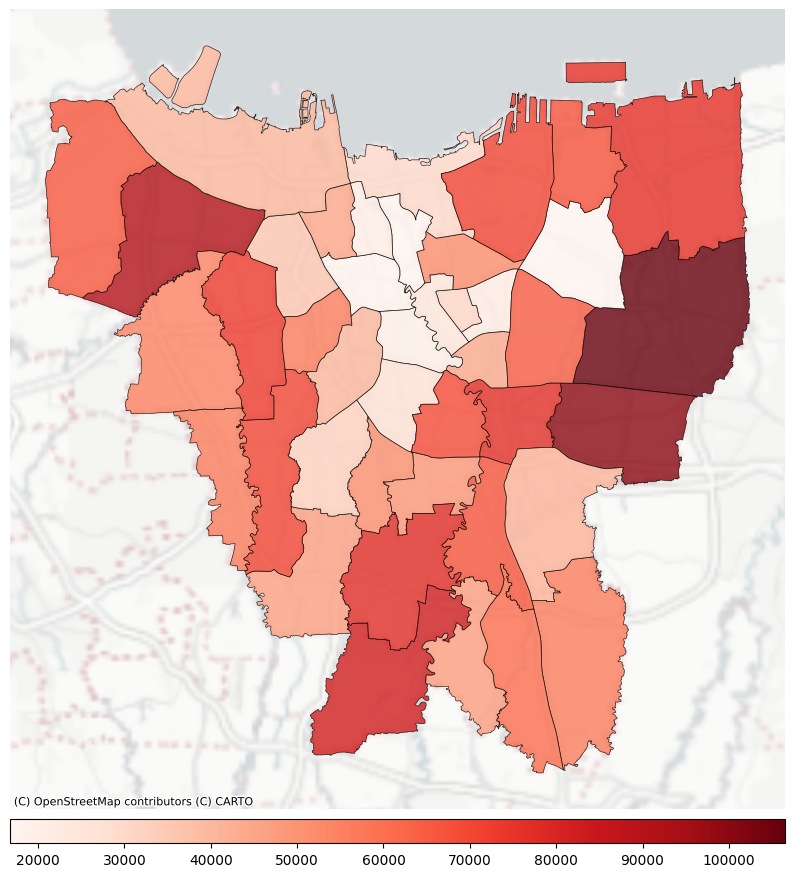

In [29]:
fig, ax = plt.subplots(figsize=(10, 15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.1)

map_paslon03_kec = gdf_kec.plot(ax=ax,
                                column='aniessandi',
                                edgecolor='k',
                                cmap='Reds',
                                linewidth=0.5,
                                legend=True,
                                alpha=0.8,
                                cax=cax,
                                categorical=False,
                                legend_kwds={"orientation": "horizontal"}
                                )

cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_kec.crs, zoom=10)
ax.set_axis_off()
plt.show()


In [30]:
gdf_kec.columns

Index(['geometry', 'KODE_KEL_DESA', 'KODE_KEC', 'KODE_KAB_KOTA',
       'KODE_PROVINSI', 'NAMA_KEL_DESA', 'NAMA_KAB_KOTA_x', 'NAMA_PROVINSI',
       'LUAS_HA', 'LUAS_SQKM', 'KODE', 'KODE_KEL_DESA_INT', 'pemilih_pilgub',
       'pengguna_hak_pilih_pilgub', 'partisipasi_pilgub',
       'partisipasi_pilgub.1', 'suara sah', 'suara tidak sah', 'Total suara',
       'agussylvi', 'ahokdjarot', 'aniessandi', 'rankagussylvi',
       'rankahokdjarot', 'rankaniessandi', 'paslon01', 'paslon02', 'paslon03',
       'rankpaslon01', 'rankpaslon02', 'rankpaslon03', 'strengthbase',
       'strengthscore', 'namadapil', 'wilayahdapil', 'jmlkursidapil',
       'NAMA_KECAMATAN_y', 'NAMA_KAB_KOTA_y', 'rank_1', 'rank_2', 'rank_3'],
      dtype='object')

In [31]:
# List of numeric percentage columns
numeric_columns = ['agussylvi', 'ahokdjarot', 'aniessandi']

# Define a function to sort the percentage columns in descending order
def get_sorted_columns(row):
    numeric_row = row[numeric_columns]
    return numeric_row.sort_values(ascending=False).index.tolist()

# Apply the function to each row and create a new column with sorted percentages
gdf_kec['sorted'] = gdf_kec.apply(get_sorted_columns, axis=1)

# Extract the ranked columns into separate new columns
for i in range(3):
    gdf_kec[f'rank_{i+1}'] = gdf_kec['sorted'].apply(lambda x: x[i] if len(x) > i else np.nan)

# Drop the temporary 'sorted' column
gdf_kec = gdf_kec.drop(columns=['sorted'])

gdf_kec.head()

,geometry,KODE_KEL_DESA,KODE_KEC,KODE_KAB_KOTA,KODE_PROVINSI,NAMA_KEL_DESA,NAMA_KAB_KOTA_x,NAMA_PROVINSI,LUAS_HA,LUAS_SQKM,...,strengthbase,strengthscore,namadapil,wilayahdapil,jmlkursidapil,NAMA_KECAMATAN_y,NAMA_KAB_KOTA_y,rank_1,rank_2,rank_3
NAMA_KECAMATAN_x,,,,,,,,,,,,,,,,,,,,,
Cakung,"POLYGON Z ((53478.895 9313037.592 0, 53408.543...",31.75.06.100731.75.06.100431.75.06.100131.75.0...,31.75.0631.75.0631.75.0631.75.0631.75.0631.75....,31.7531.7531.7531.7531.7531.7531.75,31313131313131,Cakung BaratCakung TimurJatinegaraPenggilingan...,Kota Administrasi Jakarta TimurKota Administra...,DKI JakartaDKI JakartaDKI JakartaDKI JakartaDK...,4143.728958,41.437290,...,ModerateVery StrongVery StrongVery StrongVery ...,31,DKI Jakarta 4DKI Jakarta 4DKI Jakarta 4DKI Jak...,Jakarta Timur-AJakarta Timur-AJakarta Timur-AJ...,70,CakungCakungCakungCakungCakungCakungCakung,Kota Administrasi Jakarta TimurKota Administra...,aniessandi,ahokdjarot,agussylvi
Cempaka Putih,"POLYGON Z ((43312.69 9314211.117 0, 43312.67 9...",31.71.05.100231.71.05.100131.71.05.1003,31.71.0531.71.0531.71.05,31.7131.7131.71,313131,Cempaka Putih BaratCempaka Putih TimurRawasari,Kota Administrasi Jakarta PusatKota Administra...,DKI JakartaDKI JakartaDKI Jakarta,468.566087,4.685661,...,Very StrongStrongModerate,12,DKI Jakarta 1DKI Jakarta 1DKI Jakarta 1,Jakarta PusatJakarta PusatJakarta Pusat,36,Cempaka PutihCempaka PutihCempaka Putih,Kota Administrasi Jakarta PusatKota Administra...,aniessandi,ahokdjarot,agussylvi
Cengkareng,"POLYGON Z ((31757.238 9318226.963 0, 31752.712...",31.73.01.100131.73.01.100631.73.01.100231.73.0...,31.73.0131.73.0131.73.0131.73.0131.73.0131.73.01,31.7331.7331.7331.7331.7331.73,313131313131,Cengkareng BaratCengkareng TimurDuri KosambiKa...,Kota Administrasi Jakarta BaratKota Administra...,DKI JakartaDKI JakartaDKI JakartaDKI JakartaDK...,2583.770211,25.837702,...,ModerateModerateModerateModerateModerateModerate,18,DKI Jakarta 9DKI Jakarta 9DKI Jakarta 9DKI Jak...,Jakarta Barat-AJakarta Barat-AJakarta Barat-AJ...,72,CengkarengCengkarengCengkarengCengkarengCengka...,Kota Administrasi Jakarta BaratKota Administra...,ahokdjarot,aniessandi,agussylvi
Cilandak,"POLYGON Z ((35811.117 9301509.294 0, 35814.934...",31.74.06.100131.74.06.100531.74.06.100431.74.0...,31.74.0631.74.0631.74.0631.74.0631.74.06,31.7431.7431.7431.7431.74,3131313131,Cilandak BaratCipete SelatanGandaria SelatanLe...,Kota Administrasi Jakarta SelatanKota Administ...,DKI JakartaDKI JakartaDKI JakartaDKI JakartaDK...,1782.726348,17.827263,...,StrongVery StrongStrongStrongModerate,20,DKI Jakarta 7DKI Jakarta 7DKI Jakarta 7DKI Jak...,Jakarta Selatan-AJakarta Selatan-AJakarta Sela...,50,CilandakCilandakCilandakCilandakCilandak,Kota Administrasi Jakarta SelatanKota Administ...,ahokdjarot,aniessandi,agussylvi
Cilincing,"MULTIPOLYGON Z (((50375.809 9318295.926 0, 503...",31.72.04.100131.72.04.100431.72.04.100331.72.0...,31.72.0431.72.0431.72.0431.72.0431.72.0431.72....,31.7231.7231.7231.7231.7231.7231.72,31313131313131,CilincingKalibaruMarundaRorotanSemper BaratSem...,Kota Administrasi Jakarta UtaraKota Administra...,DKI JakartaDKI JakartaDKI JakartaDKI JakartaDK...,4374.320204,43.743202,...,ModerateModerateModerateVery StrongModerateMod...,23,DKI Jakarta 2DKI Jakarta 2DKI Jakarta 2DKI Jak...,Kepulauan Seribu & Jakarta Utara-AKepulauan Se...,63,CilincingCilincingCilincingCilincingCilincingC...,Kota Administrasi Jakarta UtaraKota Administra...,aniessandi,ahokdjarot,agussylvi


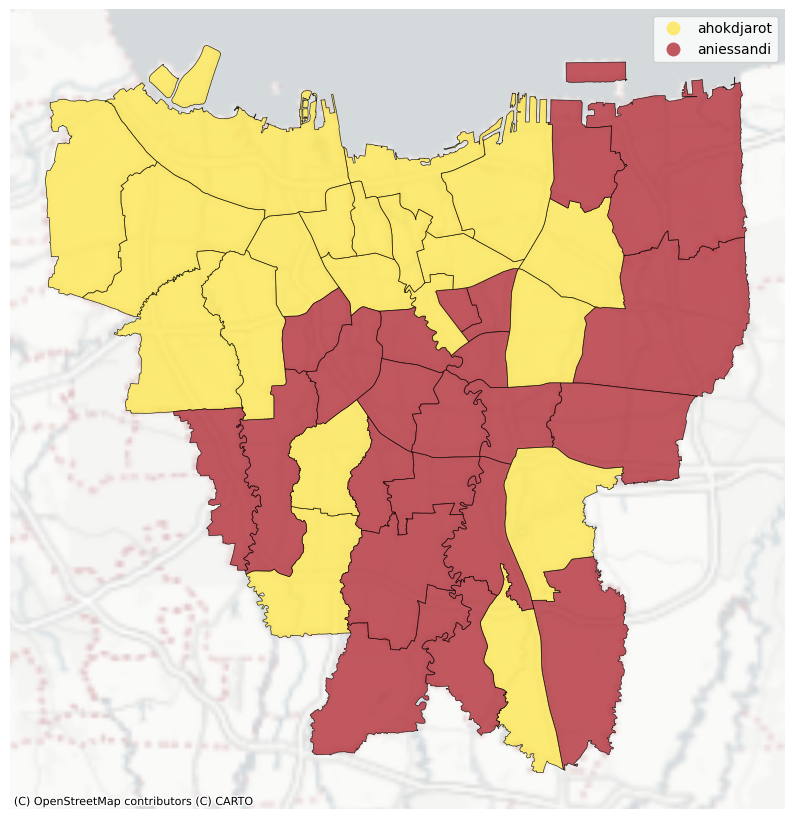

In [32]:

# Define a custom colormap
# candidates = gdf_kec.columns[:4].tolist()
# # candidates = gdf_a['rank_1'].unique().tolist() # + gdf_a['rank_2'].unique().tolist() + gdf_a['rank_3'].unique().tolist()
# # candidates = list(set(candidates))  # Ensure unique candidates
# candidates.sort(reverse=False)

# Define colors (you can specify your own colors here)
colors = [(252, 230, 82), (66, 90, 170), (179, 48, 58)]  # Replace with exact RGB values from your image

# Convert RGB to normalized values for matplotlib
colors = [(r/255, g/255, b/255) for r, g, b in colors]
cmap = ListedColormap(colors)

# Create a dictionary for candidate to color mapping
# candidate_color_map = {candidate: colors[i] for i, candidate in enumerate(candidates)}

# Function to plot the map for a given rank
def plot_rank_map(rank_column, ax):
    gdf_kec.plot(ax=ax,
               column=rank_column,
               edgecolor='k',
               linewidth=0.5,
               legend=True,
               alpha=0.8,
               cmap=cmap,
               categorical=True)
    cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=gdf_kec.crs.to_string(), zoom=10)
    ax.set_axis_off()

fig, ax = plt.subplots(figsize = (10,15))
plot_rank_map('rank_1', ax)

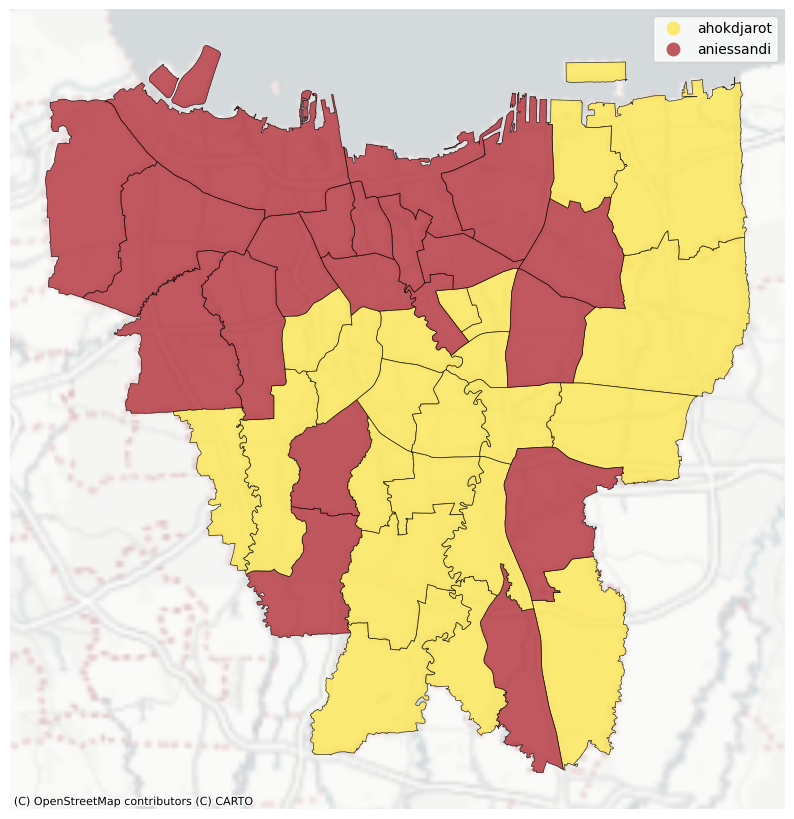

In [33]:
fig, ax = plt.subplots(figsize = (10,15))
plot_rank_map('rank_2', ax)

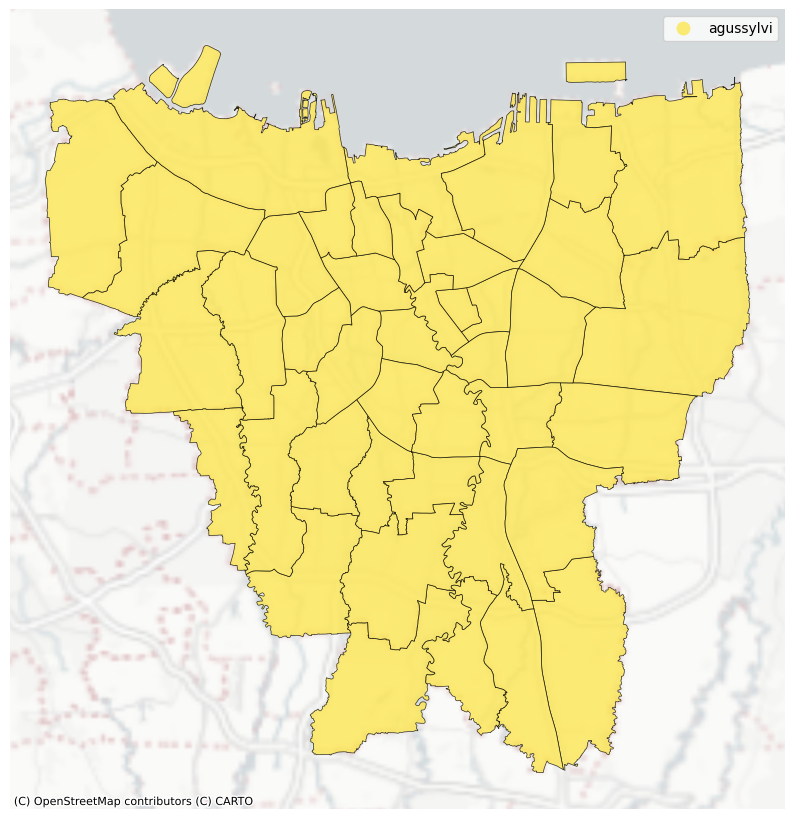

In [34]:
fig, ax = plt.subplots(figsize = (10,15))
plot_rank_map('rank_3', ax)